(A) Install Dependencies

(B) Download Nottingham Dataset

In [ ]:
!pip install pretty_midi music21 torch torchvision torchaudio soundfile

!git clone https://github.com/jukedeck/nottingham-dataset.git

fatal: destination path 'nottingham-dataset' already exists and is not an empty directory.


(C) Preprocessing (Tokens)

In [ ]:
from music21 import converter, instrument, note, chord
import glob, numpy as np, random, torch

Convert a MIDI file to a list of symbolic tokens.

In [ ]:
def midi_to_notes(file):
    midi = converter.parse(file)
    parts = instrument.partitionByInstrument(midi)
    notes_to_parse = parts.parts[0].recurse() if parts else midi.flat.notes

    seq = []
    for element in notes_to_parse:
        if isinstance(element, note.Note):
            seq.append(str(element.pitch))
        elif isinstance(element, chord.Chord):
            seq.append('.'.join(str(n.pitch) for n in element.notes))
    return seq

In [ ]:
files = glob.glob("nottingham-dataset/MIDI/**/*.mid", recursive=True)
print("🎼 Found MIDI files:", len(files))
random.shuffle(files)
files = files[:400]

dataset = [midi_to_notes(f) for f in files]
all_tokens = [t for seq in dataset for t in seq]
vocab = sorted(set(all_tokens))
print(vocab)
print("🎹 Vocabulary Size:", len(vocab))

token2idx = {t: i for i, t in enumerate(vocab)}
idx2token = {i: t for t, i in token2idx.items()}

🎼 Found MIDI files: 3089
['A2.C#3.E3', 'A2.C#3.E3.G3', 'A2.C3.E-3', 'A2.C3.E3', 'A3', 'A4', 'A4.G4', 'A5', 'A5.G5', 'B-2.D3.F3', 'B-3', 'B-4', 'B-5', 'B2.D3.F#3', 'B2.E-3.F#3', 'B2.E-3.F#3.A3', 'B3', 'B4', 'B4.C5', 'B4.D5', 'B4.E5', 'B5', 'C#2.E2.G#2', 'C#2.E2.G2', 'C#2.F2.G#2', 'C#4', 'C#5', 'C#5.A5', 'C#5.D5', 'C#5.E5', 'C2.E-2.F#2', 'C2.E-2.G2', 'C2.E2.G2', 'C2.E2.G2.A2', 'C2.E2.G2.B-2', 'C4', 'C5', 'C5.A5', 'C6', 'D2.F#2.A2', 'D2.F#2.A2.B2', 'D2.F#2.A2.C3', 'D2.F2.A2', 'D4', 'D4.E4', 'D5', 'D5.B4', 'D5.C#5', 'D5.E5', 'E-2.F#2.A2', 'E-2.G2.B-2', 'E-4', 'E-5', 'E2.G#2.B2', 'E2.G#2.B2.D3', 'E2.G2.B-2', 'E2.G2.B2', 'E4', 'E4.A4', 'E5', 'E5.C5', 'E5.D5', 'E5.F#5', 'F#2.A2.C#3', 'F#2.B-2.C#3', 'F#2.B-2.C#3.E3', 'F#4', 'F#4.A4.B4', 'F#4.A4.D5', 'F#4.A4.D5.F#5', 'F#4.G4', 'F#5', 'F#5.E5', 'F#5.G5', 'F2.A2.C3', 'F2.A2.C3.E-3', 'F2.G#2.C3', 'F4', 'F5', 'F5.D5', 'G#2.C3.E-3', 'G#2.C3.E-3.F#3', 'G#4', 'G#5', 'G2.B-2.C#3', 'G2.B-2.D3', 'G2.B2.D3', 'G2.B2.D3.F3', 'G3', 'G4', 'G4.A4', 'G4.A4.C#5'

Build training sequences

In [ ]:
seq_len = 32
inputs, targets = [], []
for seq in dataset:
    if len(seq) <= seq_len: continue
    for i in range(len(seq) - seq_len):
        inputs.append([token2idx[t] for t in seq[i:i+seq_len]])
        targets.append(token2idx[seq[i+seq_len]])

inputs, targets = np.array(inputs), np.array(targets)
print("🟢 Training Samples:", len(inputs))

🟢 Training Samples: 51122


(D) LSTM Policy Network

In [ ]:
import torch.nn as nn

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

class LSTMPolicy(nn.Module):
    def __init__(self, vocab_size, emb=128, hid=256, nlayer=2):
        super().__init__()
        self.embed = nn.Embedding(vocab_size, emb)
        self.lstm = nn.LSTM(emb, hid, nlayer, batch_first=True)
        self.fc = nn.Linear(hid, vocab_size)

    def forward(self, x, hx=None):
        x = self.embed(x)
        out, hx = self.lstm(x, hx)
        logits = self.fc(out)
        return logits, hx

model = LSTMPolicy(len(vocab)).to(device)
criterion = nn.CrossEntropyLoss()
opt = torch.optim.Adam(model.parameters(), lr=1e-3)

(E) MLE Pretraining

In [ ]:
print("\n🎶 Starting Supervised (MLE) Training...")
batch_size = 64

def batch_gen(X, y, bs):
    idx = np.random.randint(0, len(X), bs)
    return torch.tensor(X[idx]).long().to(device), torch.tensor(y[idx]).long().to(device)

for epoch in range(3):
    model.train()
    totloss = 0
    for _ in range(len(inputs)//batch_size):
        bx, by = batch_gen(inputs, targets, batch_size)
        opt.zero_grad()
        logits, _ = model(bx)
        loss = criterion(logits[:, -1, :], by)
        loss.backward()
        opt.step()
        totloss += loss.item()
    print(f"Epoch {epoch} | Loss: {totloss/(len(inputs)//batch_size):.4f}")


🎶 Starting Supervised (MLE) Training...
Epoch 0 | Loss: 2.2919
Epoch 1 | Loss: 1.7652
Epoch 2 | Loss: 1.4807


(F) Music Rewards (Musician-Oriented)

In [ ]:
import pretty_midi

C_MAJOR_PCS = set([0, 2, 4, 5, 7, 9, 11])

def scale_reward(seq):
    count, total = 0, 0
    for tok in seq:
        parts = tok.split('.')
        for p in parts:
            try:
                if pretty_midi.note_name_to_number(p) % 12 in C_MAJOR_PCS:
                    count += 1
                total += 1
            except:
                pass
    return count / (total + 1e-9)

In [ ]:
def smooth_reward(seq):
    penalties = []
    for a, b in zip(seq[:-1], seq[1:]):
        try:
            a_n = pretty_midi.note_name_to_number(a.split('.')[0])
            b_n = pretty_midi.note_name_to_number(b.split('.')[0])
            penalties.append(abs(a_n - b_n))
        except:
            continue
    if not penalties: return 0
    avg = np.mean(penalties)
    return max(0, (12 - avg) / 12)


In [ ]:
def diversity_reward(seq):
    return len(set(seq)) / len(seq)

In [ ]:
def pitch_center_reward(seq):
    pitches = []
    for tok in seq:
        try:
            p = pretty_midi.note_name_to_number(tok.split('.')[0])
            pitches.append(p)
        except:
            pass
    if not pitches:
        return 0
    avg_pitch = np.mean(pitches)

    # Encourage mid-range (C4–C5)
    target = 60  # around Middle C
    return max(0, 1 - abs(avg_pitch - target) / 30)


(G) RL Fine-Tuning

In [ ]:

def sample_sequence(model, start_seq, max_len=64):
    model.eval()
    seq = list(start_seq)
    hx = None

    for _ in range(max_len):
        inp = torch.tensor([[token2idx[t] for t in seq[-seq_len:]]]).to(device)
        logits, hx = model(inp, hx)
        temperature = 1.2
        probs = torch.softmax(logits[:, -1, :] / temperature, dim=-1).detach().cpu().numpy().ravel()
        tok = np.random.choice(len(probs), p=probs)
        seq.append(idx2token[tok])
    return seq

print("\n🎹 Starting RL Fine-Tuning...")
baseline = 0
pg_opt = torch.optim.Adam(model.parameters(), lr=5e-5)

for it in range(1000):   # Faster training
    i = np.random.randint(0, len(inputs))
    seed = [idx2token[x] for x in inputs[i]]
    seq = sample_sequence(model, seed, max_len=64)
    tail = seq[-64:]

    R = 0.5*scale_reward(tail) + 0.3*smooth_reward(tail) + 0.2*diversity_reward(tail)+ 0.2*pitch_center_reward(tail)

    baseline = 0.99*baseline + 0.01*R
    adv = R - baseline

    # Compute log-probs
    model.train()
    hx = None
    logps = []
    seq_idx = [token2idx[t] for t in seed]

    for tok in tail:
        inp = torch.tensor([seq_idx]).to(device)
        logits, hx = model(inp, hx)
        probs = torch.log_softmax(logits[:, -1, :], dim=-1)
        logps.append(probs[0, token2idx[tok]])

        seq_idx = seq_idx[-seq_len:] + [token2idx[tok]]

    loss = -adv * torch.stack(logps).sum()
    pg_opt.zero_grad()
    loss.backward()
    pg_opt.step()

    if it % 20 == 0:
        print(f"Iter {it} | Reward = {R:.4f} | Advantage = {adv:.4f}")




🎹 Starting RL Fine-Tuning...
Iter 0 | Reward = 0.7416 | Advantage = 0.7341
Iter 20 | Reward = 0.5887 | Advantage = 0.4600
Iter 40 | Reward = 0.6887 | Advantage = 0.4573
Iter 60 | Reward = 0.5920 | Advantage = 0.2772
Iter 80 | Reward = 0.6418 | Advantage = 0.2577
Iter 100 | Reward = 0.7827 | Advantage = 0.3469
Iter 120 | Reward = 0.6632 | Advantage = 0.1832
Iter 140 | Reward = 0.6025 | Advantage = 0.0820
Iter 160 | Reward = 0.5794 | Advantage = 0.0286
Iter 180 | Reward = 0.6604 | Advantage = 0.0857
Iter 200 | Reward = 0.5929 | Advantage = 0.0014
Iter 220 | Reward = 0.6240 | Advantage = 0.0170
Iter 240 | Reward = 0.6915 | Advantage = 0.0729
Iter 260 | Reward = 0.7198 | Advantage = 0.0905
Iter 280 | Reward = 0.6351 | Advantage = -0.0054
Iter 300 | Reward = 0.6183 | Advantage = -0.0310
Iter 320 | Reward = 0.5667 | Advantage = -0.0852
Iter 340 | Reward = 0.6942 | Advantage = 0.0352
Iter 360 | Reward = 0.7073 | Advantage = 0.0435
Iter 380 | Reward = 0.5771 | Advantage = -0.0897
Iter 400 | R

In [ ]:
print("\n🎵 Generating baseline MLE sequence...")
seed = [idx2token[int(x)] for x in inputs[np.random.randint(0, len(inputs))]]
mle_seq = sample_sequence(model, seed, max_len=120)


🎵 Generating baseline MLE sequence...


(H) Generate FINAL MUSIC with Symbolic Printing

In [ ]:
def print_symbolic_sequence(seq):
    print("\n🎼 SYMBOLIC MUSIC OUTPUT")
    print("-------------------------------------------------")
    prev = None
    for tok in seq:
        main = tok.split('.')[0]
        try:
            num = pretty_midi.note_name_to_number(main)
        except:
            continue

        if prev is None:
            interval = "START"
        else:
            interval = pretty_midi.note_name_to_number(main) - pretty_midi.note_name_to_number(prev)

        scale_ok = "In-Scale" if num % 12 in C_MAJOR_PCS else "Out-of-Scale"

        print(f"Note: {main:4s} | Interval: {interval:4} | PC={num%12} | {scale_ok}")

        prev = main

# Generate
generated_seed = [idx2token[int(x)] for x in inputs[np.random.randint(0, len(inputs))]]
final_seq = sample_sequence(model, generated_seed, max_len=120)

print_symbolic_sequence(final_seq[:40])   # show first 40 notes





🎼 SYMBOLIC MUSIC OUTPUT
-------------------------------------------------
Note: E5   | Interval: START | PC=4 | In-Scale
Note: F#5  | Interval:    2 | PC=6 | Out-of-Scale
Note: G#5  | Interval:    2 | PC=8 | Out-of-Scale
Note: A5   | Interval:    1 | PC=9 | In-Scale
Note: E5   | Interval:   -5 | PC=4 | In-Scale
Note: F#5  | Interval:    2 | PC=6 | Out-of-Scale
Note: A5   | Interval:    3 | PC=9 | In-Scale
Note: F#5  | Interval:   -3 | PC=6 | Out-of-Scale
Note: E5   | Interval:   -2 | PC=4 | In-Scale
Note: D5   | Interval:   -2 | PC=2 | In-Scale
Note: C#5  | Interval:   -1 | PC=1 | Out-of-Scale
Note: C#5  | Interval:    0 | PC=1 | Out-of-Scale
Note: B4   | Interval:   -2 | PC=11 | In-Scale
Note: A4   | Interval:   -2 | PC=9 | In-Scale
Note: C#5  | Interval:    4 | PC=1 | Out-of-Scale
Note: B4   | Interval:   -2 | PC=11 | In-Scale
Note: E5   | Interval:    5 | PC=4 | In-Scale
Note: D5   | Interval:   -2 | PC=2 | In-Scale
Note: D5   | Interval:    0 | PC=2 | In-Scale
Note: C#5  | Interva

Save final & baseline MIDI

In [ ]:
def save_midi(seq, filename):
    pm = pretty_midi.PrettyMIDI()
    inst = pretty_midi.Instrument(program=0)
    t = 0
    for tok in seq:
        for p in tok.split('.'):
            try:
                n = pretty_midi.note_name_to_number(p)
                if 0 <= n <= 127:
                    inst.notes.append(pretty_midi.Note(
                        velocity=90, pitch=n, start=t, end=t+0.5
                    ))
            except:
                pass
        t += 0.5
    pm.instruments.append(inst)
    pm.write(filename)


save_midi(final_seq, "rl_final.mid")
save_midi(mle_seq, "mle_output.mid")

print("\n🎵 Saved 'mle_output.mid' and 'rl_final.mid' successfully!")


🎵 Saved 'mle_output.mid' and 'rl_final.mid' successfully!


Play

In [ ]:
import pretty_midi
from IPython.display import Audio

def play_midi(path):
    pm = pretty_midi.PrettyMIDI(path)
    audio = pm.synthesize()
    return Audio(audio, rate=44100)

print("🎵 Playing MLE output...")
play_midi("mle_output.mid")


🎵 Playing MLE output...


In [ ]:
print("🎵 Playing RL output...")
play_midi("rl_final.mid")


🎵 Playing RL output...


Demo Output

In [ ]:
!pip install moviepy matplotlib pretty_midi


In [ ]:
import numpy as np
import soundfile as sf
import pretty_midi

def synthesize_local(midi_file, sr=44100):
    pm = pretty_midi.PrettyMIDI(midi_file)
    duration = pm.get_end_time()
    audio = np.zeros(int(sr * duration))

    harmonics = [1.0, 0.5, 0.25]  # simple instrument
    decay = 3.0

    for inst in pm.instruments:
        for note in inst.notes:
            s = int(note.start * sr)
            e = int(note.end * sr)
            t = np.linspace(0, (e - s) / sr, e - s, False)

            f0 = pretty_midi.note_number_to_hz(note.pitch)
            wave = np.zeros_like(t)

            for i, h in enumerate(harmonics, start=1):
                wave += h * np.sin(2 * np.pi * f0 * i * t)

            wave *= np.exp(-decay * t)
            wave *= (note.velocity / 127)

            audio[s:e] += wave

    audio /= (np.max(np.abs(audio)) + 1e-9)
    return audio

# synthesize rl_final.mid into wav
audio = synthesize_local("rl_final.mid")
sf.write("rl_final.wav", audio, 44100)

print("🎵 Saved rl_final.wav")


🎵 Saved rl_final.wav


In [ ]:
import matplotlib.pyplot as plt
import pretty_midi
import numpy as np

def save_piano_roll_image(midi_path, img_path="piano_roll.png"):
    pm = pretty_midi.PrettyMIDI(midi_path)
    roll = pm.get_piano_roll(fs=30)

    plt.figure(figsize=(12,4))
    plt.imshow(roll, aspect='auto', origin='lower', cmap='magma')
    plt.xlabel("Time Frames")
    plt.ylabel("Pitch")
    plt.title("Piano Roll Visualization")
    plt.tight_layout()
    plt.savefig(img_path, dpi=150)
    plt.close()

save_piano_roll_image("rl_final.mid", "piano_roll.png")


Sheet-music-like scrolling video

In [ ]:
!pip install music21 moviepy


In [ ]:
from moviepy.editor import ImageClip, AudioFileClip

audio = AudioFileClip("rl_final.wav")
clip = ImageClip("piano_roll.png").set_duration(audio.duration)
clip = clip.set_audio(audio)

clip.write_videofile("rl_final_demo.mp4", fps=1)


Moviepy - Building video rl_final_demo.mp4.
MoviePy - Writing audio in rl_final_demoTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video rl_final_demo.mp4



Moviepy - Done !
Moviepy - video ready rl_final_demo.mp4


In [ ]:
import matplotlib.pyplot as plt
import pretty_midi
import numpy as np

def draw_sheet_style(midi_file, out="sheet.png"):
    pm = pretty_midi.PrettyMIDI(midi_file)
    pitches = [n.pitch for inst in pm.instruments for n in inst.notes]
    times = [n.start for inst in pm.instruments for n in inst.notes]

    plt.figure(figsize=(15, 4))
    plt.scatter(times, pitches, marker="o", c=pitches, cmap="viridis")
    plt.gca().invert_yaxis()
    plt.title("Sheet-style Note Plot")
    plt.xlabel("Time")
    plt.ylabel("Pitch")
    plt.grid(True)
    plt.savefig(out, dpi=150)
    plt.close()

draw_sheet_style("rl_final.mid", "sheet_style.png")


In [ ]:
from moviepy.editor import ImageClip, AudioFileClip

audio = AudioFileClip("rl_final.wav")
clip = ImageClip("sheet_style.png").set_duration(audio.duration).set_audio(audio)
clip.write_videofile("rl_final_sheet.mp4", fps=1)


Moviepy - Building video rl_final_sheet.mp4.
MoviePy - Writing audio in rl_final_sheetTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video rl_final_sheet.mp4



Moviepy - Done !
Moviepy - video ready rl_final_sheet.mp4


Handwritten-style Scrolling Sheet Music

In [ ]:
from google.colab import files
files.download("rl_final.mid")


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
!pip install pdf2image moviepy
!apt-get install poppler-utils


Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following NEW packages will be installed:
  poppler-utils
0 upgraded, 1 newly installed, 0 to remove and 41 not upgraded.
Need to get 186 kB of archives.
After this operation, 697 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy-updates/main amd64 poppler-utils amd64 22.02.0-2ubuntu0.12 [186 kB]
Fetched 186 kB in 0s (2,147 kB/s)
Selecting previously unselected package poppler-utils.
(Reading database ... 121703 files and directories currently installed.)
Preparing to unpack .../poppler-utils_22.02.0-2ubuntu0.12_amd64.deb ...
Unpacking poppler-utils (22.02.0-2ubuntu0.12) ...
Setting up poppler-utils (22.02.0-2ubuntu0.12) ...
Processing triggers for man-db (2.10.2-1) ...


In [ ]:
!pip install pdf2image moviepy

from pdf2image import convert_from_path

pdf_path = "/content/rl_final_score_sheet.pdf"

pages = convert_from_path(pdf_path, dpi=350)   # higher DPI

image_files = []
for i, page in enumerate(pages):
    filename = f"page_{i+1}.png"
    # Save large PNG
    page.save(filename, 'PNG')
    image_files.append(filename)

image_files


['page_1.png', 'page_2.png']

In [ ]:
from moviepy.editor import ImageClip, AudioFileClip, ColorClip, CompositeVideoClip, concatenate_videoclips
import moviepy.video.fx.all as vfx

audio = AudioFileClip("/content/rl_final.wav")
duration = audio.duration

num_pages = len(image_files)
per_page = duration / num_pages

W, H = 1920, 1080   # Full HD

clips = []

for img in image_files:
    print("Loading:", img)

    # Load image safely
    clip = ImageClip(img)

    # Ensure duration is set
    clip = clip.set_duration(per_page)

    # Resize to fit inside frame (no cropping)
    clip = clip.resize(height=H * 0.90)
    if clip.w > W:
        clip = clip.resize(width=W * 0.95)

    # White background (same duration)
    bg = ColorClip((W, H), (255,255,255)).set_duration(per_page)

    # Composite (centered)
    final = CompositeVideoClip([bg, clip.set_position("center")]).set_duration(per_page)

    clips.append(final)

# Double-check: no None durations
for i, c in enumerate(clips):
    print(i, "duration =", c.duration)

video = concatenate_videoclips(clips, method="compose")
video = video.set_audio(audio)

video.write_videofile("rl_music_fullpage.mp4", fps=30)


Loading: page_1.png
Loading: page_2.png
0 duration = 38.0
1 duration = 38.0
Moviepy - Building video rl_music_fullpage.mp4.
MoviePy - Writing audio in rl_music_fullpageTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video rl_music_fullpage.mp4



Moviepy - Done !
Moviepy - video ready rl_music_fullpage.mp4


Moving Horizontally Bar by Bar

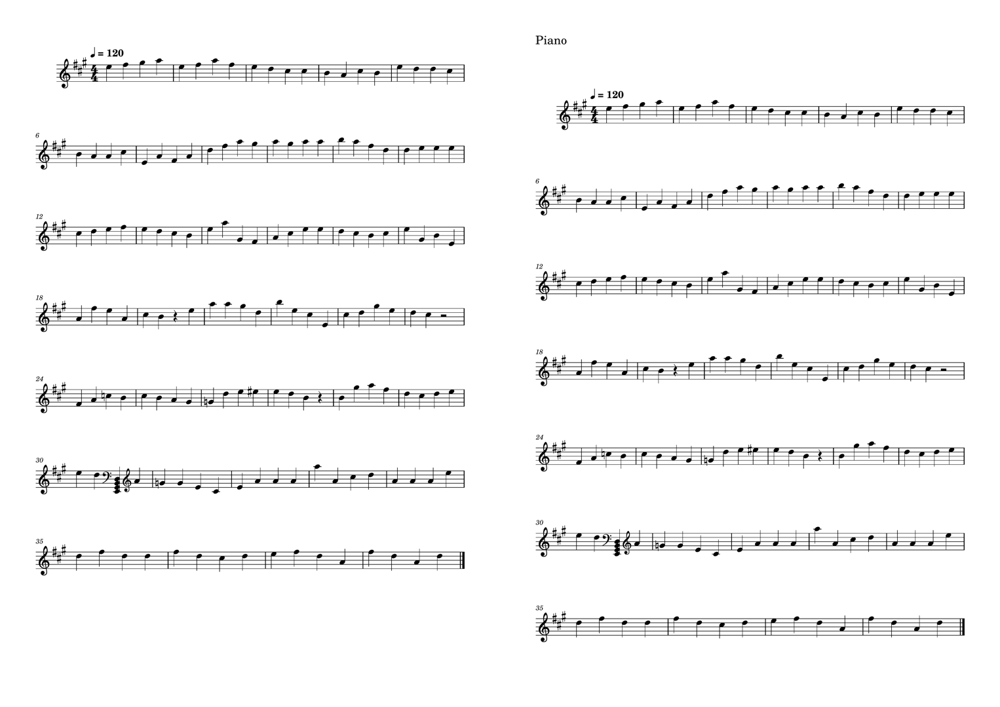

In [ ]:
from PIL import Image

# Load pages
imgs = [Image.open(i).convert("RGB") for i in image_files]

# Make equal height
H = 1080
resized = []
for im in imgs:
    w, h = im.size
    im = im.resize((int(w * (H / h)), H))
    resized.append(im)

# Stitch horizontally
total_width = sum(im.width for im in resized)
combined = Image.new("RGB", (total_width, H), (255,255,255))

x_offset = 0
for im in resized:
    combined.paste(im, (x_offset, 0))
    x_offset += im.width

combined.save("sheet_wide.png")
combined


In [ ]:
from moviepy.editor import ImageClip, AudioFileClip, VideoClip
import numpy as np

audio = AudioFileClip("rl_final.wav")
duration = audio.duration

# Load wide sheet
sheet = Image.open("sheet_wide.png")
W_sheet, H_sheet = sheet.size

# Output video size
W, H = 1920, 1080

# Convert to array once for speed
sheet_np = np.array(sheet)

def make_frame(t):
    # Progress from 0 → 1 across whole audio
    progress = t / duration

    # Compute horizontal offset
    max_scroll = W_sheet - W
    x = int(progress * max_scroll)

    frame = sheet_np[:, x:x+W]
    return frame

video = VideoClip(make_frame, duration=duration)
video = video.set_audio(audio)
video.write_videofile("rl_horizontal_scroll.mp4", fps=30)


Moviepy - Building video rl_horizontal_scroll.mp4.
MoviePy - Writing audio in rl_horizontal_scrollTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video rl_horizontal_scroll.mp4



Moviepy - Done !
Moviepy - video ready rl_horizontal_scroll.mp4


In [ ]:
# Full pipeline: Karaoke-style highlighted bar video
# Run in Colab or any Python env (Linux/Windows). Assumes:
# - /content/rl_final_score_sheet.pdf exists
# - /content/rl_final.wav exists
# Output: rl_karaoke.mp4

# Install dependencies (uncomment if needed in Colab)
!pip install -q pdf2image moviepy opencv-python-headless pillow numpy
!apt-get install -y -qq poppler-utils

import os
from pdf2image import convert_from_path
from PIL import Image, ImageDraw, ImageFilter
import numpy as np
import cv2
from moviepy.editor import VideoClip, AudioFileClip
import math
import warnings
warnings.filterwarnings("ignore")

PDF_PATH = "/content/rl_final_score_sheet.pdf"
AUDIO_PATH = "/content/rl_final.wav"
OUT_VIDEO = "rl_karaoke.mp4"

# ---------- Step 1: Convert PDF pages to high-res PNGs ----------
print("Converting PDF to images...")
pages = convert_from_path(PDF_PATH, dpi=300)
image_files = []
for i, page in enumerate(pages):
    fname = f"page_{i+1}.png"
    page.save(fname, "PNG")
    image_files.append(fname)
print("Saved pages:", image_files)

# ---------- Step 2: Detect barlines on each page ----------
def detect_barlines(page_image_path, debug=False):
    """
    Detect vertical barlines and return list of bar bounding x positions.
    Returns list of (x_start, x_end, y0, y1) for each bar region on the page.
    If detection fails, returns [].
    """
    img_color = cv2.imread(page_image_path)
    if img_color is None:
        return []
    gray = cv2.cvtColor(img_color, cv2.COLOR_BGR2GRAY)
    # Adaptive threshold to binary
    th = cv2.adaptiveThreshold(gray,255,cv2.ADAPTIVE_THRESH_MEAN_C,
                                cv2.THRESH_BINARY_INV, blockSize=51, C=15)
    # Morphology to emphasize vertical lines
    vertical_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (1, int(gray.shape[0]*0.02)))
    vertical_lines = cv2.morphologyEx(th, cv2.MORPH_OPEN, vertical_kernel, iterations=1)

    # Use Hough to get line positions
    lines = cv2.HoughLinesP(vertical_lines, rho=1, theta=np.pi/180, threshold=100,
                            minLineLength=int(gray.shape[0]*0.5), maxLineGap=20)
    if lines is None:
        # Try another strategy: find vertical projections peaks
        col_sum = np.sum(vertical_lines, axis=0)
        cols = col_sum / (np.max(col_sum)+1e-9)
        # peak detection
        peaks = np.where(cols > 0.15)[0]
        if len(peaks) < 2:
            return []
        # cluster peaks
        clusters = []
        cur = [peaks[0]]
        for p in peaks[1:]:
            if p - cur[-1] <= 5:
                cur.append(p)
            else:
                clusters.append(cur)
                cur = [p]
        clusters.append(cur)
        xs = [int(np.mean(c)) for c in clusters]
    else:
        xs = []
        for l in lines:
            x1,y1,x2,y2 = l[0]
            xs.append(int((x1+x2)/2))
        xs = sorted(list(set(xs)))

    # refine by removing too-close lines
    xs_sorted = []
    for x in sorted(xs):
        if not xs_sorted or x - xs_sorted[-1] > 12:
            xs_sorted.append(x)

    if len(xs_sorted) < 2:
        return []

    h = img_color.shape[0]
    y0 = 0
    y1 = h

    # Build bar boxes from successive x positions
    bars = []
    # extend start and end with margins
    left = 0
    for x in xs_sorted:
        # bar region from left .. x
        bars.append((left, int((left + x) / 2), y0, y1))
        left = x
    # final bar from last line to right edge
    bars.append((left, img_color.shape[1], y0, y1))

    # filter bars with very small width
    final_bars = []
    for (x0,x1,y0,y1) in bars:
        if x1 - x0 > 30:
            final_bars.append((x0,x1,y0,y1))
    if debug:
        print(f"Detected {len(final_bars)} bars on {page_image_path}")
    return final_bars

# Detect bars for all pages, fallback if none
all_page_bars = []
for pf in image_files:
    bars = detect_barlines(pf, debug=True)
    if not bars:
        # fallback: split the page evenly into 8 bar regions (tunable)
        im = Image.open(pf)
        W, H = im.size
        n = 8
        fallback = []
        step = W / n
        for i in range(n):
            x0 = int(i*step)
            x1 = int((i+1)*step)
            fallback.append((x0, x1, 0, H))
        print(f"Fallback applied for {pf}: {len(fallback)} regions")
        all_page_bars.append(fallback)
    else:
        all_page_bars.append(bars)

# Flatten bars into a sequence, remember page index
bars_sequence = []  # list of (page_index, x0,x1,y0,y1)
for pidx, bars in enumerate(all_page_bars):
    for b in bars:
        bars_sequence.append((pidx,)+b)

total_bars = len(bars_sequence)
print("Total bars detected (or fallback regions):", total_bars)
if total_bars == 0:
    raise RuntimeError("No bars found; check PDF or provide simpler fallback option.")

# ---------- Step 3: Map bars -> time using audio duration ----------
audio = AudioFileClip(AUDIO_PATH)
audio_dur = audio.duration
per_bar_duration = audio_dur/total_bars
print(f"Audio duration: {audio_dur:.2f}s, per-bar: {per_bar_duration:.3f}s")

# ---------- Step 4: Prepare wide canvas / page centering sizes ----------
# We'll render each page centered in a 1920x1080 frame, highlight the bar bbox scaled accordingly.

OUT_W, OUT_H = 1920, 1080

# Preload page images and compute scale factors
page_imgs = []
page_sizes = []
for pf in image_files:
    img = Image.open(pf).convert("RGB")
    page_imgs.append(img)
    page_sizes.append(img.size)

# Function to draw frame for time t
import numpy as np
def make_frame(t):
    # Determine current bar index and its page/bbox
    bar_idx = int(min(total_bars-1, math.floor(t / per_bar_duration)))
    pidx, x0, x1, y0, y1 = bars_sequence[bar_idx]

    # Load page image and resize to fit
    img = page_imgs[pidx]
    Wp, Hp = img.size

    # scale to fit inside OUT_H with margins
    scale = min((OUT_H*0.95)/Hp, (OUT_W*0.95)/Wp)
    newW = int(Wp*scale)
    newH = int(Hp*scale)
    img_resized = img.resize((newW, newH), Image.LANCZOS)

    # compute box coordinates in resized image space
    bx0 = int(x0 * scale)
    bx1 = int(x1 * scale)
    by0 = int(y0 * scale)
    by1 = int(y1 * scale)

    # create background and paste centered
    bg = Image.new("RGB", (OUT_W, OUT_H), (255,255,255))
    left = (OUT_W - newW)//2
    top = (OUT_H - newH)//2
    bg.paste(img_resized, (left, top))

    # draw semi-transparent rectangle (karaoke highlight) over the bar region
    overlay = Image.new("RGBA", (OUT_W, OUT_H), (255,255,255,0))
    draw = ImageDraw.Draw(overlay)
    rect_left = left + bx0
    rect_top = top + by0
    rect_right = left + bx1
    rect_bottom = top + by1

    # safety clamp
    rect_left = max(0, min(OUT_W-1, rect_left))
    rect_right = max(0, min(OUT_W, rect_right))
    rect_top = max(0, min(OUT_H-1, rect_top))
    rect_bottom = max(0, min(OUT_H, rect_bottom))

    # draw highlight (rounded rectangle by drawing and blurring)
    draw.rectangle([rect_left, rect_top, rect_right, rect_bottom], fill=(255,215,0,140))
    # optional outline
    draw.rectangle([rect_left, rect_top, rect_right, rect_bottom], outline=(200,140,0,200), width=3)

    # combine overlay + background
    out = Image.alpha_composite(bg.convert("RGBA"), overlay)

    # Optionally draw a small progress marker within the highlight to show time progress
    # compute progress within current bar
    within_bar_t = t - (bar_idx * per_bar_duration)
    prog = min(1.0, max(0.0, within_bar_t / per_bar_duration))
    # draw progress bar at bottom of highlight
    pbar_h = max(6, int((rect_bottom-rect_top) * 0.08))
    pbar_w = int((rect_right - rect_left) * prog)
    if pbar_w > 0:
        draw2 = ImageDraw.Draw(out)
        draw2.rectangle([rect_left, rect_bottom - pbar_h, rect_left + pbar_w, rect_bottom], fill=(50,50,50,200))

    return np.array(out.convert("RGB"))

# ---------- Step 5: Build VideoClip and write file ----------
FPS = 24
print("Rendering video — this may take a bit. Output:", OUT_VIDEO)
video = VideoClip(make_frame, duration=audio_dur)
video = video.set_audio(audio)
video.write_videofile(OUT_VIDEO, fps=FPS, codec="libx264", audio_codec="aac", preset="medium")

print("Done — saved to", OUT_VIDEO)


Converting PDF to images...
Saved pages: ['page_1.png', 'page_2.png']
Detected 20 bars on page_1.png
Detected 20 bars on page_2.png
Total bars detected (or fallback regions): 40
Audio duration: 76.00s, per-bar: 1.900s
Rendering video — this may take a bit. Output: rl_karaoke.mp4
Moviepy - Building video rl_karaoke.mp4.
MoviePy - Writing audio in rl_karaokeTEMP_MPY_wvf_snd.mp4


MoviePy - Done.
Moviepy - Writing video rl_karaoke.mp4



Moviepy - Done !
Moviepy - video ready rl_karaoke.mp4
Done — saved to rl_karaoke.mp4


Demo_Vanshika

In [ ]:
# Full pipeline: Karaoke-style highlighted bar video
# Run in Colab or any Python env (Linux/Windows). Assumes:
# - /content/rl_final_score_sheet.pdf exists
# - /content/rl_final.wav exists
# Output: rl_karaoke.mp4

# Install dependencies (uncomment if needed in Colab)
!pip install -q pdf2image moviepy opencv-python-headless pillow numpy
!apt-get install -y -qq poppler-utils

import os
from pdf2image import convert_from_path
from PIL import Image, ImageDraw, ImageFilter
import numpy as np
import cv2
from moviepy.editor import VideoClip, AudioFileClip
import math
import warnings
warnings.filterwarnings("ignore")

PDF_PATH = "/content/rl_score_sheet.pdf"
AUDIO_PATH = "rl.wav"
OUT_VIDEO = "rl_demo.mp4"

# ---------- Step 1: Convert PDF pages to high-res PNGs ----------
print("Converting PDF to images...")
pages = convert_from_path(PDF_PATH, dpi=300)
image_files = []
for i, page in enumerate(pages):
    fname = f"page_{i+1}.png"
    page.save(fname, "PNG")
    image_files.append(fname)
print("Saved pages:", image_files)

# ---------- Step 2: Detect barlines on each page ----------
def detect_barlines(page_image_path, debug=False):
    """
    Detect vertical barlines and return list of bar bounding x positions.
    Returns list of (x_start, x_end, y0, y1) for each bar region on the page.
    If detection fails, returns [].
    """
    img_color = cv2.imread(page_image_path)
    if img_color is None:
        return []
    gray = cv2.cvtColor(img_color, cv2.COLOR_BGR2GRAY)
    # Adaptive threshold to binary
    th = cv2.adaptiveThreshold(gray,255,cv2.ADAPTIVE_THRESH_MEAN_C,
                                cv2.THRESH_BINARY_INV, blockSize=51, C=15)
    # Morphology to emphasize vertical lines
    vertical_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (1, int(gray.shape[0]*0.02)))
    vertical_lines = cv2.morphologyEx(th, cv2.MORPH_OPEN, vertical_kernel, iterations=1)

    # Use Hough to get line positions
    lines = cv2.HoughLinesP(vertical_lines, rho=1, theta=np.pi/180, threshold=100,
                            minLineLength=int(gray.shape[0]*0.5), maxLineGap=20)
    if lines is None:
        # Try another strategy: find vertical projections peaks
        col_sum = np.sum(vertical_lines, axis=0)
        cols = col_sum / (np.max(col_sum)+1e-9)
        # peak detection
        peaks = np.where(cols > 0.15)[0]
        if len(peaks) < 2:
            return []
        # cluster peaks
        clusters = []
        cur = [peaks[0]]
        for p in peaks[1:]:
            if p - cur[-1] <= 5:
                cur.append(p)
            else:
                clusters.append(cur)
                cur = [p]
        clusters.append(cur)
        xs = [int(np.mean(c)) for c in clusters]
    else:
        xs = []
        for l in lines:
            x1,y1,x2,y2 = l[0]
            xs.append(int((x1+x2)/2))
        xs = sorted(list(set(xs)))

    # refine by removing too-close lines
    xs_sorted = []
    for x in sorted(xs):
        if not xs_sorted or x - xs_sorted[-1] > 12:
            xs_sorted.append(x)

    if len(xs_sorted) < 2:
        return []

    h = img_color.shape[0]
    y0 = 0
    y1 = h

    # Build bar boxes from successive x positions
    bars = []
    # extend start and end with margins
    left = 0
    for x in xs_sorted:
        # bar region from left .. x
        bars.append((left, int((left + x) / 2), y0, y1))
        left = x
    # final bar from last line to right edge
    bars.append((left, img_color.shape[1], y0, y1))

    # filter bars with very small width
    final_bars = []
    for (x0,x1,y0,y1) in bars:
        if x1 - x0 > 30:
            final_bars.append((x0,x1,y0,y1))
    if debug:
        print(f"Detected {len(final_bars)} bars on {page_image_path}")
    return final_bars

# Detect bars for all pages, fallback if none
all_page_bars = []
for pf in image_files:
    bars = detect_barlines(pf, debug=True)
    if not bars:
        # fallback: split the page evenly into 8 bar regions (tunable)
        im = Image.open(pf)
        W, H = im.size
        n = 8
        fallback = []
        step = W / n
        for i in range(n):
            x0 = int(i*step)
            x1 = int((i+1)*step)
            fallback.append((x0, x1, 0, H))
        print(f"Fallback applied for {pf}: {len(fallback)} regions")
        all_page_bars.append(fallback)
    else:
        all_page_bars.append(bars)

# Flatten bars into a sequence, remember page index
bars_sequence = []  # list of (page_index, x0,x1,y0,y1)
for pidx, bars in enumerate(all_page_bars):
    for b in bars:
        bars_sequence.append((pidx,)+b)

total_bars = len(bars_sequence)
print("Total bars detected (or fallback regions):", total_bars)
if total_bars == 0:
    raise RuntimeError("No bars found; check PDF or provide simpler fallback option.")

# ---------- Step 3: Map bars -> time using audio duration ----------
audio = AudioFileClip(AUDIO_PATH)
audio_dur = audio.duration
per_bar_duration = audio_dur/total_bars
print(f"Audio duration: {audio_dur:.2f}s, per-bar: {per_bar_duration:.3f}s")

# ---------- Step 4: Prepare wide canvas / page centering sizes ----------
# We'll render each page centered in a 1920x1080 frame, highlight the bar bbox scaled accordingly.

OUT_W, OUT_H = 1920, 1080

# Preload page images and compute scale factors
page_imgs = []
page_sizes = []
for pf in image_files:
    img = Image.open(pf).convert("RGB")
    page_imgs.append(img)
    page_sizes.append(img.size)

# Function to draw frame for time t
import numpy as np
def make_frame(t):
    # Determine current bar index and its page/bbox
    bar_idx = int(min(total_bars-1, math.floor(t / per_bar_duration)))
    pidx, x0, x1, y0, y1 = bars_sequence[bar_idx]

    # Load page image and resize to fit
    img = page_imgs[pidx]
    Wp, Hp = img.size

    # scale to fit inside OUT_H with margins
    scale = min((OUT_H*0.95)/Hp, (OUT_W*0.95)/Wp)
    newW = int(Wp*scale)
    newH = int(Hp*scale)
    img_resized = img.resize((newW, newH), Image.LANCZOS)

    # compute box coordinates in resized image space
    bx0 = int(x0 * scale)
    bx1 = int(x1 * scale)
    by0 = int(y0 * scale)
    by1 = int(y1 * scale)

    # create background and paste centered
    bg = Image.new("RGB", (OUT_W, OUT_H), (255,255,255))
    left = (OUT_W - newW)//2
    top = (OUT_H - newH)//2
    bg.paste(img_resized, (left, top))

    # draw semi-transparent rectangle (karaoke highlight) over the bar region
    overlay = Image.new("RGBA", (OUT_W, OUT_H), (255,255,255,0))
    draw = ImageDraw.Draw(overlay)
    rect_left = left + bx0
    rect_top = top + by0
    rect_right = left + bx1
    rect_bottom = top + by1

    # safety clamp
    rect_left = max(0, min(OUT_W-1, rect_left))
    rect_right = max(0, min(OUT_W, rect_right))
    rect_top = max(0, min(OUT_H-1, rect_top))
    rect_bottom = max(0, min(OUT_H, rect_bottom))

    # draw highlight (rounded rectangle by drawing and blurring)
    draw.rectangle([rect_left, rect_top, rect_right, rect_bottom], fill=(255,215,0,140))
    # optional outline
    draw.rectangle([rect_left, rect_top, rect_right, rect_bottom], outline=(200,140,0,200), width=3)

    # combine overlay + background
    out = Image.alpha_composite(bg.convert("RGBA"), overlay)

    # Optionally draw a small progress marker within the highlight to show time progress
    # compute progress within current bar
    within_bar_t = t - (bar_idx * per_bar_duration)
    prog = min(1.0, max(0.0, within_bar_t / per_bar_duration))
    # draw progress bar at bottom of highlight
    pbar_h = max(6, int((rect_bottom-rect_top) * 0.08))
    pbar_w = int((rect_right - rect_left) * prog)
    if pbar_w > 0:
        draw2 = ImageDraw.Draw(out)
        draw2.rectangle([rect_left, rect_bottom - pbar_h, rect_left + pbar_w, rect_bottom], fill=(50,50,50,200))

    return np.array(out.convert("RGB"))

# ---------- Step 5: Build VideoClip and write file ----------
FPS = 24
print("Rendering video — this may take a bit. Output:", OUT_VIDEO)
video = VideoClip(make_frame, duration=audio_dur)
video = video.set_audio(audio)
video.write_videofile(OUT_VIDEO, fps=FPS, codec="libx264", audio_codec="aac", preset="medium")

print("Done — saved to", OUT_VIDEO)

Converting PDF to images...
Saved pages: ['page_1.png']
Detected 15 bars on page_1.png
Total bars detected (or fallback regions): 15
Audio duration: 30.13s, per-bar: 2.009s
Rendering video — this may take a bit. Output: rl_demo.mp4
Moviepy - Building video rl_demo.mp4.
MoviePy - Writing audio in rl_demoTEMP_MPY_wvf_snd.mp4


MoviePy - Done.
Moviepy - Writing video rl_demo.mp4



Moviepy - Done !
Moviepy - video ready rl_demo.mp4
Done — saved to rl_demo.mp4


Visualization

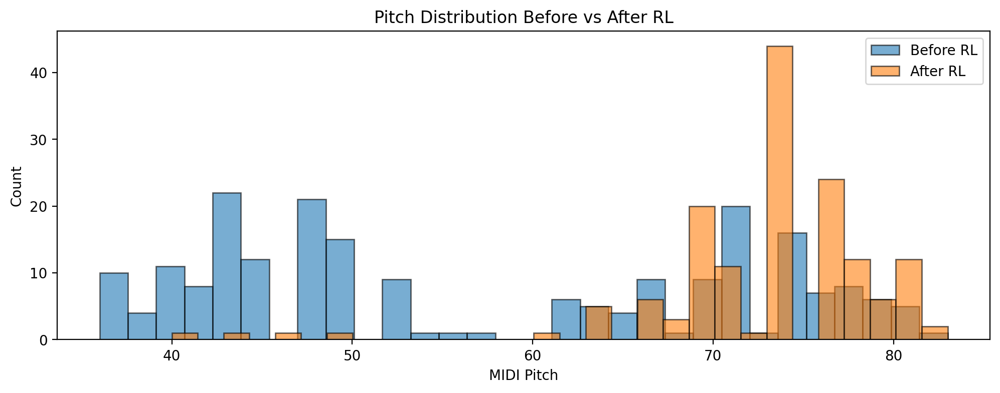

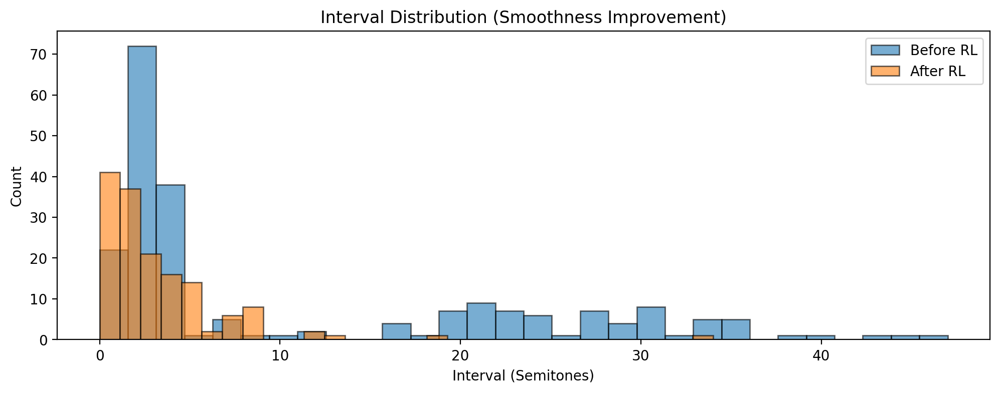

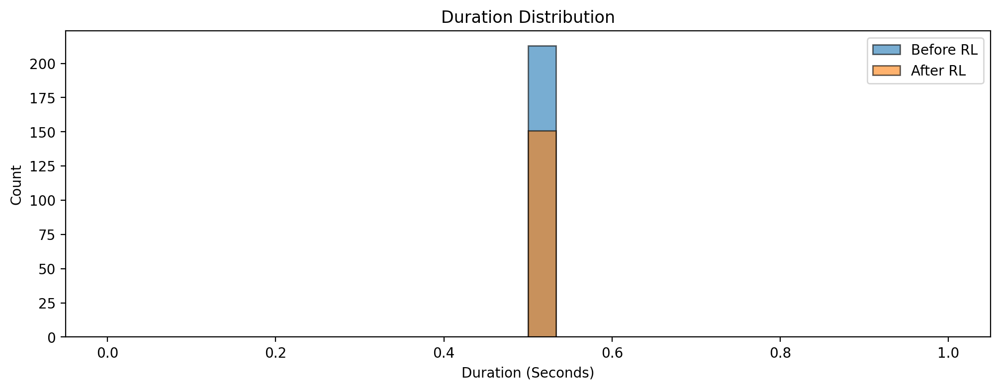

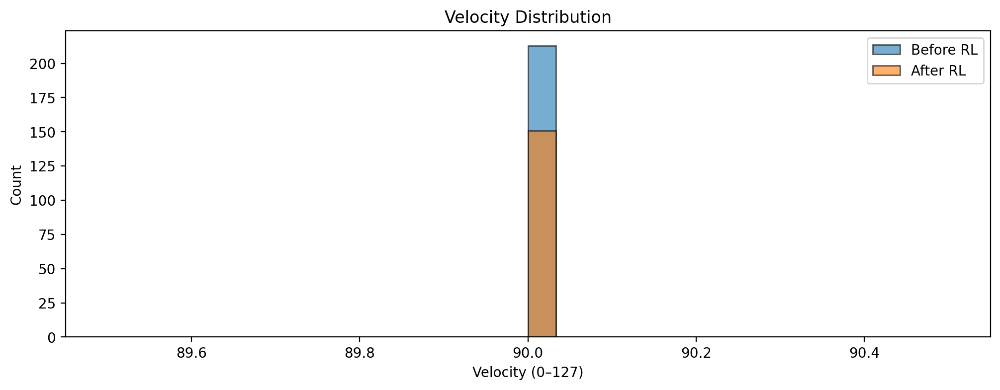

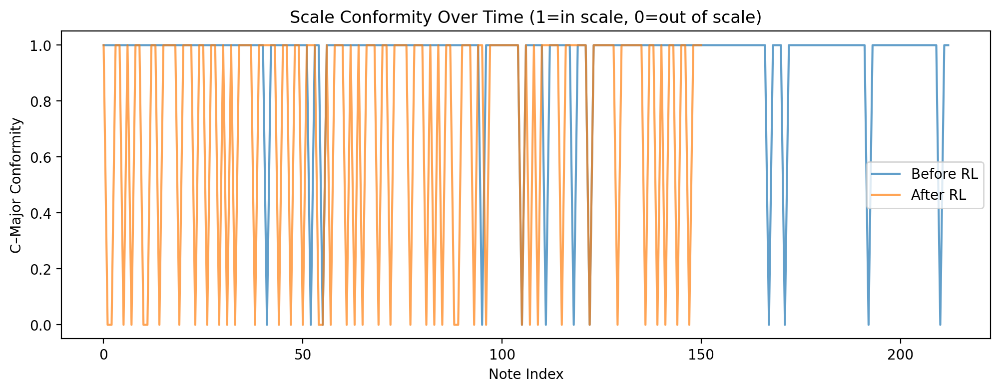

In [ ]:
import pretty_midi
import numpy as np
import matplotlib.pyplot as plt

def extract_midi_features(midi_path):
    pm = pretty_midi.PrettyMIDI(midi_path)

    pitches = []
    durations = []
    velocities = []

    for inst in pm.instruments:
        for n in inst.notes:
            pitches.append(n.pitch)
            durations.append(n.end - n.start)
            velocities.append(n.velocity)

    # compute intervals
    intervals = []
    for i in range(1, len(pitches)):
        intervals.append(abs(pitches[i] - pitches[i-1]))

    return np.array(pitches), np.array(durations), np.array(velocities), np.array(intervals)

def plot_compare(before, after, title, xlabel, bins=30):
    plt.figure(figsize=(12,4))

    plt.hist(before, bins=bins, alpha=0.6, label="Before RL", edgecolor='black')
    plt.hist(after, bins=bins, alpha=0.6, label="After RL", edgecolor='black')

    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel("Count")
    plt.legend()
    plt.show()

# ----------------------------------
# Load MIDI files
# ----------------------------------
before_midi = "mle_output.mid"
after_midi = "rl_final.mid"

p_before, d_before, v_before, i_before = extract_midi_features(before_midi)
p_after, d_after, v_after, i_after = extract_midi_features(after_midi)

# ----------------------------------
# Comparison Graphs
# ----------------------------------

# 1. Pitch Distribution
plot_compare(p_before, p_after, "Pitch Distribution Before vs After RL", "MIDI Pitch")

# 2. Interval Distribution
plot_compare(i_before, i_after, "Interval Distribution (Smoothness Improvement)", "Interval (Semitones)")

# 3. Duration Distribution
plot_compare(d_before, d_after, "Duration Distribution", "Duration (Seconds)")

# 4. Velocity Distribution
plot_compare(v_before, v_after, "Velocity Distribution", "Velocity (0–127)")

# 5. Scale Conformity Trend
C_MAJOR = {0,2,4,5,7,9,11}

def scale_conformity_sequence(midi_path):
    pm = pretty_midi.PrettyMIDI(midi_path)
    xs = []
    for inst in pm.instruments:
        for n in inst.notes:
            xs.append(1 if (n.pitch % 12) in C_MAJOR else 0)
    return xs

sc_before = scale_conformity_sequence(before_midi)
sc_after = scale_conformity_sequence(after_midi)

plt.figure(figsize=(12,4))
plt.plot(sc_before[:300], label="Before RL", alpha=0.7)
plt.plot(sc_after[:300], label="After RL", alpha=0.7)
plt.title("Scale Conformity Over Time (1=in scale, 0=out of scale)")
plt.xlabel("Note Index")
plt.ylabel("C–Major Conformity")
plt.legend()
plt.show()
